<a href="https://colab.research.google.com/github/Laeliatikoh18/Pengelolaan_Data_Penduduk/blob/master/GFP_TeamD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Business statement

Southwest Airline (WN) has higher delay percentage compared to their main competitor: Delta Airline (DL). How to reduce %arrival delay of WN from 11,44% to % in 12-months to compete with DL?


## Data Description



WN dataset

- We explore flight data during Jan-Dec 2015 from all airline. We decide to focus our analysis only on data from Soutwest airline (WN) with number of flight/year > 1000 times. 

- https://drive.google.com/file/d/1DIBJpn6e8hhXmCYyalmT0ESOzLoo3Tuv/view?usp=share_link



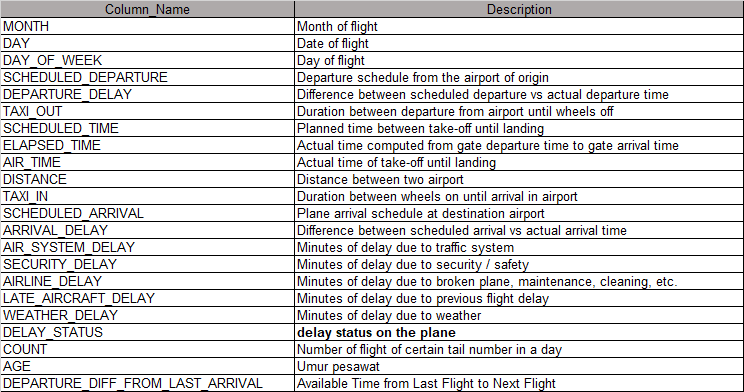


In [ ]:
# connect to google drive
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


## Libraries

In [ ]:
# import libraries
import pandas as pd
import numpy as np
from sklearn import preprocessing
import matplotlib.pyplot as plt
plt.rc("font", size=14)
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import seaborn as sns
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)

## Import Data

CSV-file import

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/GFP/WN_clean_edited_hour.csv")
data.head()

,INDEX,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,TAIL_NUMBER,UNIK_X,COUNT,...,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY,FLIGHTDATE,FIRST_FLIGHT_DATE,AGE,SCHEDULED_DEPARTURE_HOUR,DEPARTURE_TIME_HOUR,SCHEDULED_ARRIVAL_HOUR,ARRIVAL_TIME_HOUR
0,0,2015,1,1,4,WN,484,N200WN,11N200WN,1,...,0,0,0,1/1/2015,1/1/2005,10.0,13.0,13.0,14.0,14.0
1,1,2015,1,1,4,WN,484,N200WN,11N200WN,2,...,0,0,0,1/1/2015,1/1/2005,10.0,18.0,18.0,20.0,20.0
2,2,2015,1,1,4,WN,808,N201LV,11N201LV,1,...,0,0,0,1/1/2015,1/2/2005,9.9,10.0,10.0,11.0,11.0
3,3,2015,1,1,4,WN,808,N201LV,11N201LV,2,...,12,17,0,1/1/2015,1/2/2005,9.9,15.0,15.0,16.0,16.0
4,4,2015,1,1,4,WN,642,N201LV,11N201LV,3,...,0,22,0,1/1/2015,1/2/2005,9.9,16.0,17.0,18.0,18.0


rename columns agar mudah untuk di pahami

In [ ]:
data.rename(columns= {"COUNT": "DAILY_FLIGHT_FREQUENCY_PER_PLANE", "DEPARTURE_DIFF_FROM_LAST_ARRIVAL": "DEPARTURE_ARRIVAL_GAP"}, inplace= True)

# Data Cleaning

## Handling Missing Values

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768736 entries, 0 to 768735
Data columns (total 45 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   INDEX                               768736 non-null  int64  
 1   YEAR                                768736 non-null  int64  
 2   MONTH                               768736 non-null  int64  
 3   DAY                                 768736 non-null  int64  
 4   DAY_OF_WEEK                         768736 non-null  int64  
 5   AIRLINE                             768736 non-null  object 
 6   FLIGHT_NUMBER                       768736 non-null  int64  
 7   TAIL_NUMBER                         768736 non-null  object 
 8   UNIK_X                              768736 non-null  object 
 9   DAILY_FLIGHT_FREQUENCY_PER_PLANE    768736 non-null  int64  
 10  DISTANCE_TRAVELLED_BEFORE           768736 non-null  int64  
 11  DEPARTURE_ARRIVAL_GAP     

In [ ]:
data.isna().sum()

INDEX                                     0
YEAR                                      0
MONTH                                     0
DAY                                       0
DAY_OF_WEEK                               0
AIRLINE                                   0
FLIGHT_NUMBER                             0
TAIL_NUMBER                               0
UNIK_X                                    0
DAILY_FLIGHT_FREQUENCY_PER_PLANE          0
DISTANCE_TRAVELLED_BEFORE                 0
DEPARTURE_ARRIVAL_GAP                     0
DEPARTURE_DIFF_FROM_LAST_ARRIVAL.1        0
ORIGIN_AIRPORT                            0
DESTINATION_AIRPORT                       0
UNIQ                                      0
ROUTE                                     0
SCHEDULED_DEPARTURE                       0
DEPARTURE_TIME                            0
DEPARTURE_DELAY                           0
TAXI_OUT                                  0
WHEELS_OFF                                0
SCHEDULED_TIME                  

In [ ]:
data.dropna(subset=['SCHEDULED_DEPARTURE_HOUR','DEPARTURE_TIME_HOUR','SCHEDULED_ARRIVAL_HOUR','ARRIVAL_TIME_HOUR'], inplace=True)
data.isna().sum()

INDEX                                 0
YEAR                                  0
MONTH                                 0
DAY                                   0
DAY_OF_WEEK                           0
AIRLINE                               0
FLIGHT_NUMBER                         0
TAIL_NUMBER                           0
UNIK_X                                0
DAILY_FLIGHT_FREQUENCY_PER_PLANE      0
DISTANCE_TRAVELLED_BEFORE             0
DEPARTURE_ARRIVAL_GAP                 0
DEPARTURE_DIFF_FROM_LAST_ARRIVAL.1    0
ORIGIN_AIRPORT                        0
DESTINATION_AIRPORT                   0
UNIQ                                  0
ROUTE                                 0
SCHEDULED_DEPARTURE                   0
DEPARTURE_TIME                        0
DEPARTURE_DELAY                       0
TAXI_OUT                              0
WHEELS_OFF                            0
SCHEDULED_TIME                        0
ELAPSED_TIME                          0
AIR_TIME                              0


In [ ]:
data['DELAY_STATUS'] = np.where(data['ARRIVAL_DELAY']>= 30,1,0)

In [ ]:
data1 = data.copy()

In [ ]:
filter_canceled = data1['CANCELLED'] > 0

In [ ]:
print(data1[filter_canceled])

Empty DataFrame
Columns: [INDEX, YEAR, MONTH, DAY, DAY_OF_WEEK, AIRLINE, FLIGHT_NUMBER, TAIL_NUMBER, UNIK_X, DAILY_FLIGHT_FREQUENCY_PER_PLANE, DISTANCE_TRAVELLED_BEFORE, DEPARTURE_ARRIVAL_GAP, DEPARTURE_DIFF_FROM_LAST_ARRIVAL.1, ORIGIN_AIRPORT, DESTINATION_AIRPORT, UNIQ, ROUTE, SCHEDULED_DEPARTURE, DEPARTURE_TIME, DEPARTURE_DELAY, TAXI_OUT, WHEELS_OFF, SCHEDULED_TIME, ELAPSED_TIME, AIR_TIME, DISTANCE, WHEELS_ON, TAXI_IN, SCHEDULED_ARRIVAL, ARRIVAL_TIME, ARRIVAL_DELAY, CANCELLED, CANCELLATION_REASON, AIR_SYSTEM_DELAY, SECURITY_DELAY, AIRLINE_DELAY, LATE_AIRCRAFT_DELAY, WEATHER_DELAY, FLIGHTDATE, FIRST_FLIGHT_DATE, AGE, SCHEDULED_DEPARTURE_HOUR, DEPARTURE_TIME_HOUR, SCHEDULED_ARRIVAL_HOUR, ARRIVAL_TIME_HOUR, DELAY_STATUS]
Index: []

[0 rows x 46 columns]


In [ ]:
data1 = data1[~(filter_canceled)]

In [ ]:
data1.drop(['INDEX'
,'YEAR'
,'AIRLINE'
,'FLIGHT_NUMBER'
,'UNIK_X'
,'UNIQ'
,'ROUTE'
,'CANCELLED' 
,'TAIL_NUMBER'
,'WHEELS_ON'
,'WHEELS_OFF'
,'CANCELLATION_REASON'
,'ORIGIN_AIRPORT'
,'DESTINATION_AIRPORT'
,'SCHEDULED_DEPARTURE'
,'DEPARTURE_TIME'
,'SCHEDULED_ARRIVAL'
,'ARRIVAL_TIME'
,'FLIGHTDATE'
,'FIRST_FLIGHT_DATE' ],axis=1,inplace=True)

## Duplicate Values

In [ ]:
data1.duplicated().sum()

0

In [ ]:
data1.columns

Index(['MONTH', 'DAY', 'DAY_OF_WEEK', 'DAILY_FLIGHT_FREQUENCY_PER_PLANE',
       'DISTANCE_TRAVELLED_BEFORE', 'DEPARTURE_ARRIVAL_GAP',
       'DEPARTURE_DIFF_FROM_LAST_ARRIVAL.1', 'DEPARTURE_DELAY', 'TAXI_OUT',
       'SCHEDULED_TIME', 'ELAPSED_TIME', 'AIR_TIME', 'DISTANCE', 'TAXI_IN',
       'ARRIVAL_DELAY', 'AIR_SYSTEM_DELAY', 'SECURITY_DELAY', 'AIRLINE_DELAY',
       'LATE_AIRCRAFT_DELAY', 'WEATHER_DELAY', 'AGE',
       'SCHEDULED_DEPARTURE_HOUR', 'DEPARTURE_TIME_HOUR',
       'SCHEDULED_ARRIVAL_HOUR', 'ARRIVAL_TIME_HOUR', 'DELAY_STATUS'],
      dtype='object')

## Typos

In [ ]:
for i in data1.columns:
  unique_data = data1[i].value_counts()
  print(unique_data,'\n')

7     67378
5     65015
8     64929
6     64855
3     64697
4     64587
10    64246
12    63495
11    62081
9     61656
1     61043
2     54106
Name: MONTH, dtype: int64 

16    25627
13    25570
9     25471
2     25456
20    25426
23    25296
3     25267
22    25174
8     25146
27    25138
19    25077
10    25034
17    24981
12    24955
28    24945
18    24889
6     24847
15    24835
14    24815
11    24792
4     24724
21    24563
7     24549
5     24510
26    24250
24    24141
1     23997
25    23952
29    23720
30    23580
31    13361
Name: DAY, dtype: int64 

3    114156
4    113947
5    113519
2    113238
1    112614
7    103227
6     87387
Name: DAY_OF_WEEK, dtype: int64 

1     215002
2     190205
3     146413
4      97041
5      57024
6      29594
7      14549
8       6249
9       1733
10       260
11        16
12         2
Name: DAILY_FLIGHT_FREQUENCY_PER_PLANE, dtype: int64 

0       215002
337       3832
239       2844
283       2735
369       2619
         ...  
4797       

In [ ]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 758088 entries, 0 to 768735
Data columns (total 26 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   MONTH                               758088 non-null  int64  
 1   DAY                                 758088 non-null  int64  
 2   DAY_OF_WEEK                         758088 non-null  int64  
 3   DAILY_FLIGHT_FREQUENCY_PER_PLANE    758088 non-null  int64  
 4   DISTANCE_TRAVELLED_BEFORE           758088 non-null  int64  
 5   DEPARTURE_ARRIVAL_GAP               758088 non-null  int64  
 6   DEPARTURE_DIFF_FROM_LAST_ARRIVAL.1  758088 non-null  int64  
 7   DEPARTURE_DELAY                     758088 non-null  int64  
 8   TAXI_OUT                            758088 non-null  int64  
 9   SCHEDULED_TIME                      758088 non-null  int64  
 10  ELAPSED_TIME                        758088 non-null  int64  
 11  AIR_TIME                  

## Handling Outliers

bisa jadi data outlier itu merupakan data delay maka tidak di hapus

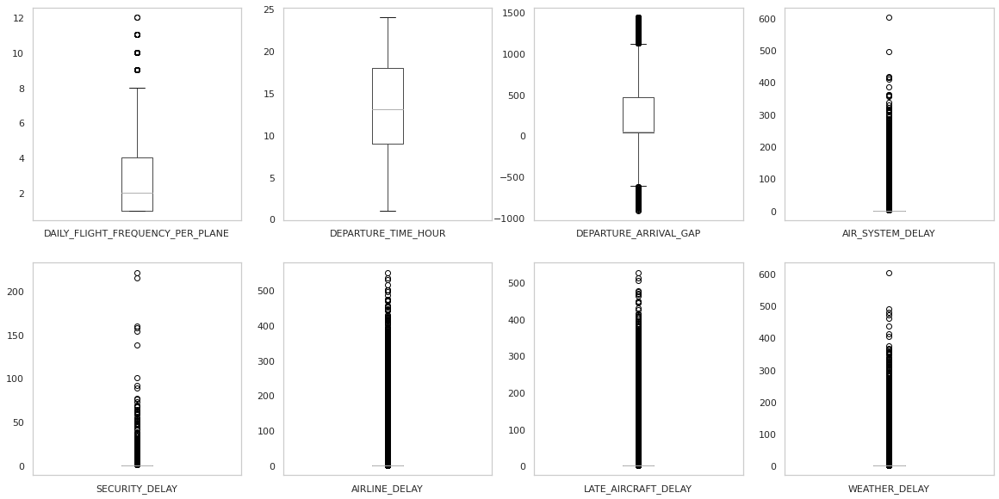

In [ ]:
numerical_column = [ 'DAILY_FLIGHT_FREQUENCY_PER_PLANE', 'DEPARTURE_TIME_HOUR',
       'DEPARTURE_ARRIVAL_GAP','AIR_SYSTEM_DELAY',
       'SECURITY_DELAY', 'AIRLINE_DELAY', 'LATE_AIRCRAFT_DELAY',
       'WEATHER_DELAY']

fig, axes = plt.subplots(nrows=2, ncols=4,figsize=(20,10))
for i, el in enumerate(numerical_column):
    data1.boxplot(el, ax=axes.flatten()[i],grid=False)
plt.show()

In [ ]:
# data1.to_csv("flightWN1.csv")

In [ ]:
data1.loc[data1['SCHEDULED_DEPARTURE_HOUR'].between (5,10), 'DEPARTURE_TIME_GROUP'] = 1
data1.loc[data1['SCHEDULED_DEPARTURE_HOUR'].between (11,15), 'DEPARTURE_TIME_GROUP'] = 2
data1.loc[data1['SCHEDULED_DEPARTURE_HOUR'].between (16,20), 'DEPARTURE_TIME_GROUP'] = 3
data1.loc[data1['SCHEDULED_DEPARTURE_HOUR']>= 21, 'DEPARTURE_TIME_GROUP'] = 4

In [ ]:
data1

,MONTH,DAY,DAY_OF_WEEK,DAILY_FLIGHT_FREQUENCY_PER_PLANE,DISTANCE_TRAVELLED_BEFORE,DEPARTURE_ARRIVAL_GAP,DEPARTURE_DIFF_FROM_LAST_ARRIVAL.1,DEPARTURE_DELAY,TAXI_OUT,SCHEDULED_TIME,...,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY,AGE,SCHEDULED_DEPARTURE_HOUR,DEPARTURE_TIME_HOUR,SCHEDULED_ARRIVAL_HOUR,ARRIVAL_TIME_HOUR,DELAY_STATUS,DEPARTURE_TIME_GROUP
0,1,1,4,1,0,1360,1371,-2,9,70,...,0,0,0,10.0,13.0,13.0,14.0,14.0,0,2.0
1,1,1,4,2,289,250,266,7,14,170,...,0,0,0,10.0,18.0,18.0,20.0,20.0,0,3.0
2,1,1,4,1,0,1340,1347,-2,14,85,...,0,0,0,9.9,10.0,10.0,11.0,11.0,0,1.0
3,1,1,4,2,406,195,224,29,9,65,...,12,17,0,9.9,15.0,15.0,16.0,16.0,0,2.0
4,1,1,4,3,714,35,29,23,9,80,...,0,22,0,9.9,16.0,17.0,18.0,18.0,0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
768731,12,31,4,1,0,980,928,0,18,75,...,0,0,0,4.1,9.0,9.0,11.0,11.0,0,1.0
768732,12,31,4,2,377,30,36,11,10,95,...,0,0,0,4.1,11.0,11.0,13.0,13.0,0,2.0
768733,12,31,4,3,754,35,42,15,13,65,...,7,8,0,4.1,13.0,13.0,14.0,15.0,0,2.0
768734,12,31,4,4,1035,55,34,-5,20,70,...,0,0,0,4.1,15.0,15.0,16.0,16.0,0,2.0


# Data Analysis

## Data Exploration

In [ ]:
data1["DELAY_STATUS"].value_counts()

0    671331
1     86757
Name: DELAY_STATUS, dtype: int64

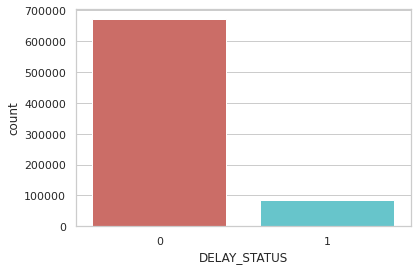

<Figure size 432x288 with 0 Axes>

In [ ]:
sns.countplot(x='DELAY_STATUS', data=data1, palette='hls')
plt.show()
plt.savefig('count_plot')

In [ ]:
count_no_delay = len(data1[data["DELAY_STATUS"] == 0])
count_delay = len(data[data1["DELAY_STATUS"] ==1])
pct_of_no_delay = count_no_delay/(count_no_delay+count_delay)
print("percentage of no delay is", pct_of_no_delay*100)
pct_of_delay = count_delay/(count_no_delay+count_delay)
print("percentage of delay is", pct_of_delay*100)

percentage of no delay is 88.55581410073763
percentage of delay is 11.444185899262354


Our classes are imbalanced, and the ratio of no-delay to delay instances is 88:12. Before we go ahead to balance the classes, let's do some more exploration.

In [ ]:
data1.groupby('DELAY_STATUS').mean()

,MONTH,DAY,DAY_OF_WEEK,DAILY_FLIGHT_FREQUENCY_PER_PLANE,DISTANCE_TRAVELLED_BEFORE,DEPARTURE_ARRIVAL_GAP,DEPARTURE_DIFF_FROM_LAST_ARRIVAL.1,DEPARTURE_DELAY,TAXI_OUT,SCHEDULED_TIME,...,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY,AGE,SCHEDULED_DEPARTURE_HOUR,DEPARTURE_TIME_HOUR,SCHEDULED_ARRIVAL_HOUR,ARRIVAL_TIME_HOUR,DEPARTURE_TIME_GROUP
DELAY_STATUS,,,,,,,,,,,,,,,,,,,,,
0,6.568658,15.715999,3.895454,2.627561,902.633325,283.671743,289.067386,2.655389,11.463609,109.763284,...,0.003751,0.650164,0.833589,0.024183,10.842332,12.882936,12.869534,14.657808,14.561787,2.021623
1,6.448217,15.701350,3.881105,3.363049,1308.906106,205.116648,232.203211,71.990479,14.678954,108.493839,...,0.057263,21.424773,38.834376,3.818724,11.772025,15.776272,16.855896,17.510310,17.593036,2.555137


In [ ]:
data1.groupby('DEPARTURE_TIME_GROUP').mean()

,MONTH,DAY,DAY_OF_WEEK,DAILY_FLIGHT_FREQUENCY_PER_PLANE,DISTANCE_TRAVELLED_BEFORE,DEPARTURE_ARRIVAL_GAP,DEPARTURE_DIFF_FROM_LAST_ARRIVAL.1,DEPARTURE_DELAY,TAXI_OUT,SCHEDULED_TIME,...,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY,AGE,SCHEDULED_DEPARTURE_HOUR,DEPARTURE_TIME_HOUR,SCHEDULED_ARRIVAL_HOUR,ARRIVAL_TIME_HOUR,DELAY_STATUS
DEPARTURE_TIME_GROUP,,,,,,,,,,,,,,,,,,,,,
1.0,6.588311,15.744081,3.810007,1.453148,233.248304,431.253571,428.015818,2.738309,12.356854,112.587035,...,0.011302,1.776347,1.059191,0.291273,10.820242,7.687497,7.662380,9.577717,9.482268,0.043928
2.0,6.542159,15.705196,3.971873,2.713907,947.975470,209.049112,223.412371,11.100462,11.608263,109.981319,...,0.005966,3.284721,4.729553,0.461487,11.151405,13.024400,13.164912,14.856800,14.921198,0.110194
3.0,6.525891,15.670894,3.929670,3.786805,1563.261212,180.230039,196.609669,17.389126,11.612225,108.549613,...,0.012248,3.914297,9.244127,0.679808,10.923644,18.003885,18.246461,19.715751,19.708407,0.181253
4.0,6.574452,15.805936,3.793413,4.411695,1915.199597,197.426127,193.082451,18.292748,11.117511,96.703156,...,0.009971,4.334048,10.427757,0.291525,10.769865,21.332247,21.419415,22.418086,21.429150,0.199597


In [ ]:
data1.groupby('DAY_OF_WEEK').mean()

,MONTH,DAY,DAILY_FLIGHT_FREQUENCY_PER_PLANE,DISTANCE_TRAVELLED_BEFORE,DEPARTURE_ARRIVAL_GAP,DEPARTURE_DIFF_FROM_LAST_ARRIVAL.1,DEPARTURE_DELAY,TAXI_OUT,SCHEDULED_TIME,ELAPSED_TIME,...,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY,AGE,SCHEDULED_DEPARTURE_HOUR,DEPARTURE_TIME_HOUR,SCHEDULED_ARRIVAL_HOUR,ARRIVAL_TIME_HOUR,DELAY_STATUS,DEPARTURE_TIME_GROUP
DAY_OF_WEEK,,,,,,,,,,,,,,,,,,,,,
1,6.574254,15.869119,2.773705,976.542233,263.627791,272.806800,11.130641,11.859929,108.988314,103.893486,...,3.115971,5.505248,0.580363,10.998166,13.126032,13.245218,14.882599,14.798995,0.120882,2.071687
2,6.620057,15.684611,2.780595,983.048182,262.341793,273.258606,10.171762,11.681017,109.009034,103.634663,...,2.946078,5.091471,0.423930,10.997738,13.174226,13.277080,14.930703,14.846951,0.111411,2.081907
3,6.648026,15.512203,2.788745,986.430472,261.595448,270.732305,9.493640,11.841944,109.038158,103.817417,...,2.819396,4.651880,0.344073,10.967135,13.195391,13.290786,14.947318,14.865868,0.104287,2.085611
4,6.510088,15.550747,2.766567,972.930863,263.720940,271.485252,11.572968,12.164041,109.057544,104.288292,...,3.140723,5.637103,0.523024,10.961578,13.123215,13.249002,14.888036,14.817529,0.124532,2.070559
5,6.416926,15.685216,2.779297,977.525269,264.070112,269.057330,11.442596,12.002290,108.973256,103.966138,...,3.110633,5.615227,0.488614,10.969572,13.191342,13.314564,14.954853,14.899206,0.120253,2.083290
6,6.465538,16.165471,2.388181,797.599071,313.032373,320.336743,9.059963,11.450090,113.387861,107.069495,...,2.880314,4.123085,0.461007,10.750899,12.723517,12.815842,14.589870,14.515912,0.095392,1.972971
7,6.635987,15.632209,2.622482,911.532564,306.052341,311.575411,10.945693,11.722582,109.750550,104.399363,...,3.159726,5.436000,0.383097,10.951036,13.914925,14.034274,15.667151,15.586998,0.120569,2.197855


In [ ]:
data1.groupby('MONTH').mean()

,DAY,DAY_OF_WEEK,DAILY_FLIGHT_FREQUENCY_PER_PLANE,DISTANCE_TRAVELLED_BEFORE,DEPARTURE_ARRIVAL_GAP,DEPARTURE_DIFF_FROM_LAST_ARRIVAL.1,DEPARTURE_DELAY,TAXI_OUT,SCHEDULED_TIME,ELAPSED_TIME,...,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY,AGE,SCHEDULED_DEPARTURE_HOUR,DEPARTURE_TIME_HOUR,SCHEDULED_ARRIVAL_HOUR,ARRIVAL_TIME_HOUR,DELAY_STATUS,DEPARTURE_TIME_GROUP
MONTH,,,,,,,,,,,,,,,,,,,,,
1,15.909850,3.999459,2.665547,916.121701,279.032731,289.467015,9.440149,12.032256,109.960356,104.558410,...,2.775437,4.761299,0.304113,10.874914,13.213276,13.303966,15.028767,14.990826,0.110201,2.068509
2,14.538887,3.848390,2.658263,911.560788,279.148154,295.033046,9.941134,12.192862,109.974772,104.447141,...,2.798248,4.625384,0.416682,10.706162,13.197446,13.294293,15.009500,14.976620,0.109064,2.064688
3,16.274000,3.847350,2.737948,975.589610,271.678053,282.637294,9.899733,11.613151,110.791150,104.872112,...,2.985069,4.582933,0.289442,10.784175,13.314744,13.413945,15.100066,15.028935,0.102771,2.108088
4,15.522226,3.867744,2.744685,977.564897,266.935761,273.665382,9.060368,11.574094,109.958660,104.746094,...,2.621596,4.581944,0.385790,10.904580,13.279716,13.363432,15.057922,14.972378,0.100872,2.102095
5,15.847235,4.067815,2.710298,964.383958,271.135661,278.035161,11.981035,11.578190,110.160271,104.782912,...,3.214643,5.981020,0.653926,10.936672,13.309375,13.439652,15.097439,15.021549,0.127401,2.104222
6,15.513854,3.756164,2.824933,1011.566510,261.673734,267.988790,15.845779,11.822450,109.430653,104.976733,...,4.493470,7.544276,0.880179,11.192974,13.254260,13.437715,14.981266,14.798813,0.160913,2.099098
7,16.190136,3.909421,2.822346,1006.418163,263.554647,267.512630,15.962406,11.988706,109.334872,105.084939,...,4.351331,8.138740,0.529847,11.329507,13.255469,13.453590,14.971385,14.859895,0.168289,2.099187
8,15.894700,3.947604,2.715058,947.509757,275.139768,282.609050,11.776294,11.889371,108.800921,103.588859,...,3.242265,5.638020,0.711700,10.972726,13.125383,13.262610,14.903479,14.840318,0.125090,2.064640
9,15.612495,3.767581,2.662969,912.778108,280.799517,288.030654,5.452040,11.863160,108.308843,102.648550,...,1.829149,2.737365,0.302371,10.882234,13.090681,13.127855,14.879752,14.809508,0.068444,2.053717


## Visualizations

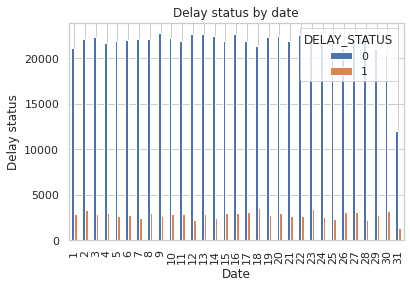

In [ ]:
%matplotlib inline
pd.crosstab(data1.DAY,data1.DELAY_STATUS).plot(kind='bar')
plt.title('Delay status by date')
plt.xlabel('Date')
plt.ylabel('Delay status')
plt.savefig('delay_status_by_day')

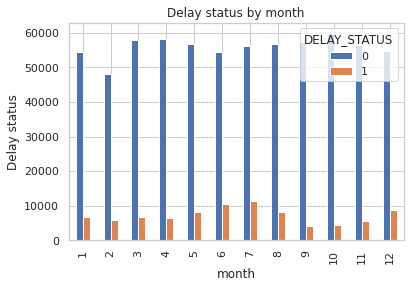

In [ ]:
%matplotlib inline
pd.crosstab(data1.MONTH,data1.DELAY_STATUS).plot(kind='bar')
plt.title('Delay status by month')
plt.xlabel('month')
plt.ylabel('Delay status')
plt.savefig('delay_status_by_month')

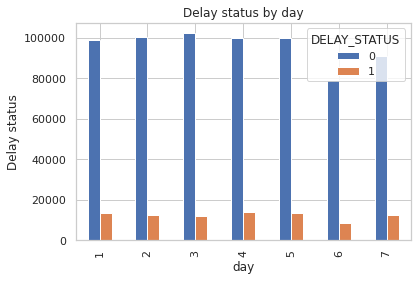

In [ ]:
%matplotlib inline
pd.crosstab(data1.DAY_OF_WEEK,data1.DELAY_STATUS).plot(kind='bar')
plt.title('Delay status by day')
plt.xlabel('day')
plt.ylabel('Delay status')
plt.savefig('delay_status_by_day')

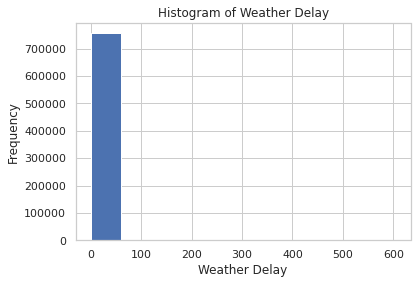

In [ ]:
data1.WEATHER_DELAY.hist()
plt.title('Histogram of Weather Delay')
plt.xlabel('Weather Delay')
plt.ylabel('Frequency')
plt.savefig('hist_wd')

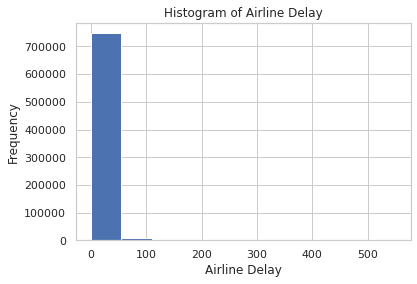

In [ ]:
data1.AIRLINE_DELAY.hist()
plt.title('Histogram of Airline Delay')
plt.xlabel('Airline Delay')
plt.ylabel('Frequency')
plt.savefig('hist_ad')

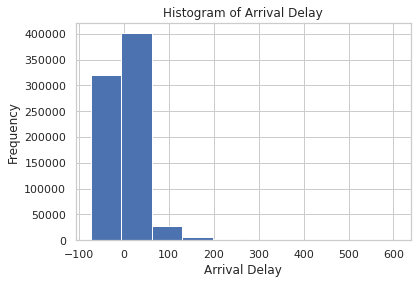

In [ ]:
data1.ARRIVAL_DELAY.hist()
plt.title('Histogram of Arrival Delay')
plt.xlabel('Arrival Delay')
plt.ylabel('Frequency')
plt.savefig('hist_arrd')

In [ ]:
data1

,MONTH,DAY,DAY_OF_WEEK,DAILY_FLIGHT_FREQUENCY_PER_PLANE,DISTANCE_TRAVELLED_BEFORE,DEPARTURE_ARRIVAL_GAP,DEPARTURE_DIFF_FROM_LAST_ARRIVAL.1,DEPARTURE_DELAY,TAXI_OUT,SCHEDULED_TIME,...,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY,AGE,SCHEDULED_DEPARTURE_HOUR,DEPARTURE_TIME_HOUR,SCHEDULED_ARRIVAL_HOUR,ARRIVAL_TIME_HOUR,DELAY_STATUS,DEPARTURE_TIME_GROUP
0,1,1,4,1,0,1360,1371,-2,9,70,...,0,0,0,10.0,13.0,13.0,14.0,14.0,0,2.0
1,1,1,4,2,289,250,266,7,14,170,...,0,0,0,10.0,18.0,18.0,20.0,20.0,0,3.0
2,1,1,4,1,0,1340,1347,-2,14,85,...,0,0,0,9.9,10.0,10.0,11.0,11.0,0,1.0
3,1,1,4,2,406,195,224,29,9,65,...,12,17,0,9.9,15.0,15.0,16.0,16.0,0,2.0
4,1,1,4,3,714,35,29,23,9,80,...,0,22,0,9.9,16.0,17.0,18.0,18.0,0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
768731,12,31,4,1,0,980,928,0,18,75,...,0,0,0,4.1,9.0,9.0,11.0,11.0,0,1.0
768732,12,31,4,2,377,30,36,11,10,95,...,0,0,0,4.1,11.0,11.0,13.0,13.0,0,2.0
768733,12,31,4,3,754,35,42,15,13,65,...,7,8,0,4.1,13.0,13.0,14.0,15.0,0,2.0
768734,12,31,4,4,1035,55,34,-5,20,70,...,0,0,0,4.1,15.0,15.0,16.0,16.0,0,2.0


# Over sampling using SMOTE
With our training data created, we'll up-sample the no delay using the SMOTE algorithm(Synthetic Minority Oversampling Technique). At a high level, SMOTE:
1. Works by creating synthetic samples from the minor class (no delay) instead of creating copies.
2. Randomly choosing one of the k-nearest-neighbors and using it to create a similar, but randomly tweaked, new observations.

In [ ]:
X = data1.loc[:, data1.columns != 'DELAY_STATUS']
y = data1.loc[:, data1.columns == 'DELAY_STATUS']

from imblearn.over_sampling import SMOTE

os = SMOTE(random_state = 0)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)
columns = X_train.columns

os_data_X, os_data_y = os.fit_resample(X_train, y_train)
os_data_X = pd.DataFrame(data = os_data_X, columns = columns)
os_data_y = pd.DataFrame(data = os_data_y, columns = ['DELAY_STATUS'])

#Check the number of our data
print("Length of oversampled data is", len(os_data_X))
print("Number of no delay in oversampled data", len(os_data_y[os_data_y['DELAY_STATUS']==0]))
print("Number of delay", len(os_data_y[os_data_y['DELAY_STATUS']==1]))
print("Proportion of no delay data in oversampled data is", len(os_data_y[os_data_y['DELAY_STATUS']==0])/len(os_data_X))
print("Proportion of delay data in oversampled data is", len(os_data_y[os_data_y['DELAY_STATUS']==1])/len(os_data_X))

Length of oversampled data is 939838
Number of no delay in oversampled data 469919
Number of delay 469919
Proportion of no delay data in oversampled data is 0.5
Proportion of delay data in oversampled data is 0.5


## Corellation

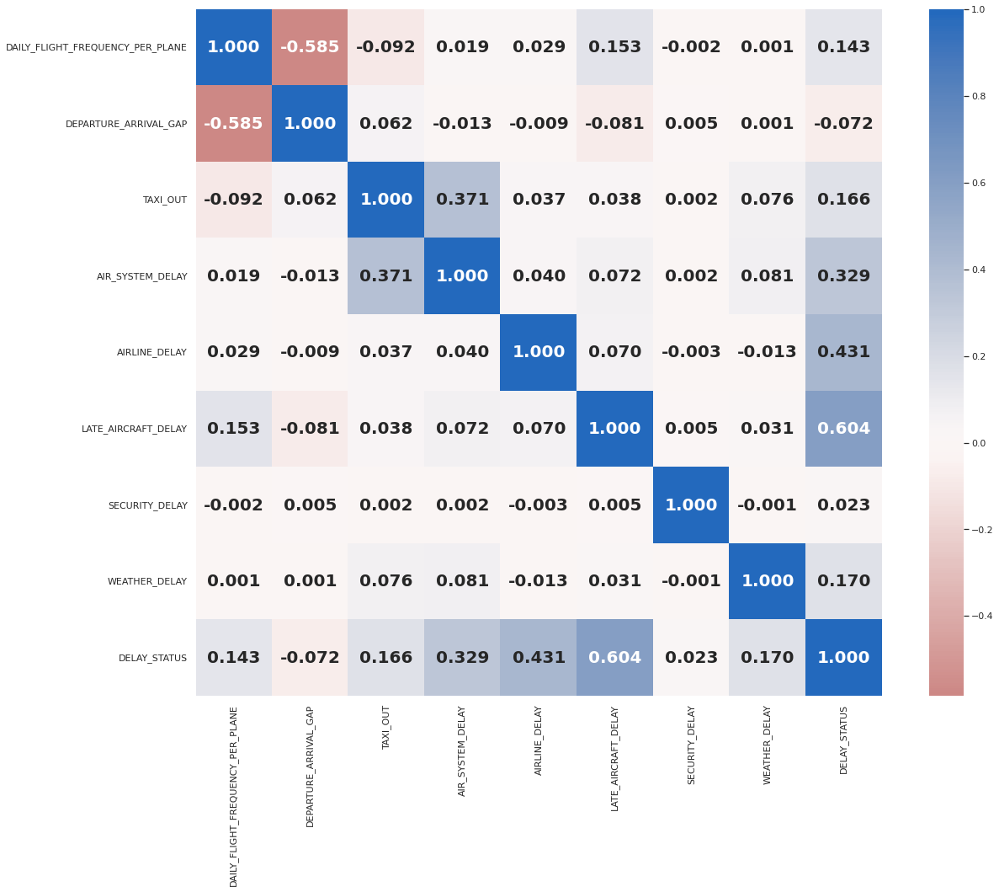

In [ ]:
numeric_vars = ['DAILY_FLIGHT_FREQUENCY_PER_PLANE', 
       'DEPARTURE_ARRIVAL_GAP', 'TAXI_OUT',
       'AIR_SYSTEM_DELAY', 'AIRLINE_DELAY',
       'LATE_AIRCRAFT_DELAY', 'SECURITY_DELAY','WEATHER_DELAY', 
       'DELAY_STATUS']
plt.figure(figsize = [20, 15])
sns.heatmap(data1[numeric_vars].corr(), annot = True, fmt = '.3f',
           cmap = 'vlag_r', center = 0 ,annot_kws={'fontsize':20, 'fontweight':'bold'},square=True)
plt.show()

## Decision Tree for prediction

In [ ]:
X = os_data_X[['DAILY_FLIGHT_FREQUENCY_PER_PLANE', 
       'DEPARTURE_ARRIVAL_GAP'
,'AIR_SYSTEM_DELAY'
,'WEATHER_DELAY'
,'AIRLINE_DELAY']]
y = os_data_y['DELAY_STATUS']

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0)

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
# we must apply the scaling to the test set that we computed for the training set
X_test_scaled = scaler.transform(X_test)

In [ ]:
from matplotlib import pyplot as plt
from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

from sklearn import tree
# Prepare the data data

# Fit the classifier with default hyper-parameters
clf = DecisionTreeClassifier(max_depth=7, random_state=1234)
model = clf.fit(X_train, y_train)
#  Step 4: Predict labels of unseen (test) data
# Not doing this step in the tutorial
y_predicted = clf.predict(X_test)
confusion = confusion_matrix(y_test, y_predicted)
#confusion
#sum(y_predicted)

print('Recall: {:.3f}'.format(recall_score(y_test, y_predicted)))
print('Precision: {:.3f}'.format(precision_score(y_test, y_predicted)))
print('Accuracy: {:.3f}'.format(accuracy_score(y_test, y_predicted)))
print('F1: {:.3f}'.format(f1_score(y_test, y_predicted)))
confusion = confusion_matrix(y_test, y_predicted)
print(confusion)
print('Feature importances: {}'.format(clf.feature_importances_))

Recall: 0.880
Precision: 0.919
Accuracy: 0.902
F1: 0.899
[[109035   9048]
 [ 14008 102869]]
Feature importances: [0.02030519 0.00596344 0.26976884 0.03940853 0.66455401]


In [ ]:
from sklearn.metrics import r2_score

y_pred=clf.predict(X_train)
r2_score(y_train,y_pred)

0.6042651117581104

In [ ]:
print(clf.score(X_train, y_train), clf.score(X_test, y_test))

0.9010665675478593 0.90187265917603


In [ ]:

# Prepare the data data

# Fit the classifier with default hyper-parameters
# clf = DecisionTreeClassifier(max_depth=4, random_state=1234)
# model = clf.fit(X_train, y_train)
#  Step 4: Predict labels of unseen (test) data
# Not doing this step in the tutorial
clf.predict(X_test)


array([0, 0, 0, ..., 0, 1, 0])

In [ ]:
text_representation = tree.export_text(clf)
print(text_representation)


|--- feature_4 <= 0.50
|   |--- feature_2 <= 0.50
|   |   |--- feature_3 <= 0.50
|   |   |   |--- feature_0 <= 3.50
|   |   |   |   |--- feature_0 <= 1.50
|   |   |   |   |   |--- feature_1 <= 970.50
|   |   |   |   |   |   |--- feature_1 <= 264.50
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- feature_1 >  264.50
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_1 >  970.50
|   |   |   |   |   |   |--- feature_1 <= 974.50
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- feature_1 >  974.50
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_0 >  1.50
|   |   |   |   |   |--- feature_1 <= 24.50
|   |   |   |   |   |   |--- feature_1 <= 20.50
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- feature_1 >  20.50
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_1 >  24.50
|   |   |   |   |   |   |--- feature_0 <= 2.50
|   |   |   |   |   |   |   |--- clas

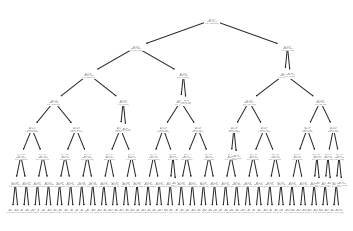

In [ ]:
tree.plot_tree(clf);

In [ ]:
fn=['DAILY_FLIGHT_FREQUENCY_PER_PLANE', 
       'DEPARTURE_ARRIVAL_GAP'
,'AIR_SYSTEM_DELAY'
,'WEATHER_DELAY'
,'AIRLINE_DELAY']
cn=['0','1']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (250,30), dpi=250)
tree.plot_tree(clf,
               feature_names = fn, 
               class_names=cn,
               filled = True,
                fontsize=16);
fig.savefig('imagename.png')

In [ ]:
pip install dtreeviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:3208: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).size
/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


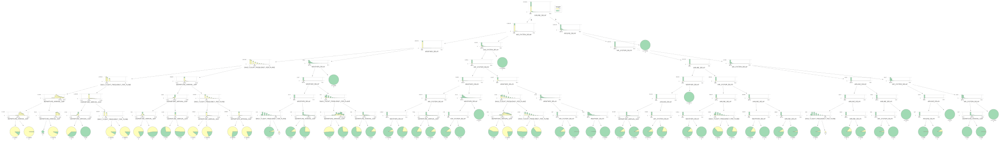

In [ ]:
from dtreeviz.trees import dtreeviz # remember to load the package

viz = dtreeviz(clf, X_train, y_train,
                target_name="target",
                feature_names=fn,
                class_names=cn)
viz